# Automatic Labeling for Coastline Detection

This notebook demonstrates how to automatically classify pixels between water and mainland in PNG images using K-Means clustering and an autoencoder for semi-supervised learning. This approach avoids manual labeling of the dataset.

## Steps
1. Preprocess Images
2. Apply K-Means Clustering
3. Post-Process the Clustering Results
4. Use Autoencoder for Semi-Supervised Classification

## Preprocessing Images
We will load the images, resize them if necessary, and normalize the pixel values.

In [27]:
import os
import random
import json
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Input, Cropping2D
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint
from tensorflow.keras.metrics import AUC, Precision, Recall
from sklearn.metrics import confusion_matrix, classification_report, f1_score, cohen_kappa_score, matthews_corrcoef
import seaborn as sns
from PIL import Image
from tqdm import tqdm
import cv2
from sklearn.cluster import KMeans
from tensorflow.keras.callbacks import Callback
import pickle

# Set system encoding to UTF-8 (solve a windows issue with charmap undefined encoding)
import sys
sys.stdin.reconfigure(encoding='utf-8')
#sys.stdout.reconfigure(encoding='utf-8'

In [13]:

# Define function to load and preprocess images
def load_and_preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256, 256))
    return image


# Function to verify and clean images
def verify_images(directory):
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                img = Image.open(file_path)
                img.verify()  # Verify that it is an image
            except (IOError, SyntaxError) as e:
                print(f"Deleting corrupted image: {file_path}")
                os.remove(file_path)

# Normalize images

In [14]:
# Define paths to the directories
img_height, img_width = 150, 150
batch_size = 32
epochs = 50
start_epoch = 0
base_dir = 'classification'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Verify and clean images
verify_images(train_dir)
verify_images(validation_dir)

# Data preprocessing and augmentation by using ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

Found 1205 images belonging to 3 classes.
Found 243 images belonging to 3 classes.


## Applying K-Means Clustering
We will convert the image into a vector of pixel values and apply the K-Means algorithm to cluster the pixels into two classes: water and mainland.

In [15]:
# Load and preprocess a sample image for demonstration
def load_and_preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256, 256))
    return image

# Apply K-Means to the image
def apply_kmeans(image, n_clusters=2):
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(pixel_values)
    segmented_image = labels.reshape(image.shape[:2])
    segmented_image = segmented_image.astype('uint8')  # Convert to uint8
    return segmented_image

## Post-Processing
After clustering, we apply morphological filters to remove small misclassified regions and smooth the results.

In [16]:
# Post-process the segmented image
def post_process(segmented_image):
    kernel = np.ones((5,5),np.uint8)
    processed_image = cv2.morphologyEx(segmented_image, cv2.MORPH_CLOSE, kernel)
    return processed_image

## Example of K-Means Clustering and Post-Processing
Load an image, apply K-Means clustering, and then post-process the results.

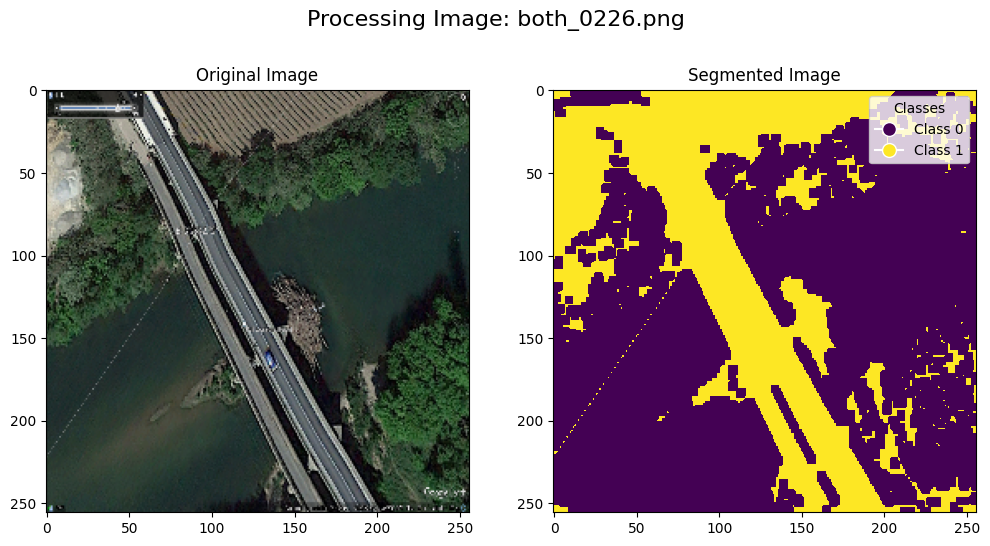

In [19]:
# Select a random image from the 'both' directory
both_dir = os.path.join(train_dir, 'both')
image_files = [f for f in os.listdir(both_dir) if os.path.isfile(os.path.join(both_dir, f))]
random_image = random.choice(image_files)
image_path = os.path.join(both_dir, random_image)

# Load and preprocess the selected image
image = load_and_preprocess_image(image_path)

# Apply K-Means
segmented_image = apply_kmeans(image)

# Post-Process
processed_image = post_process(segmented_image)

# Display results
plt.figure(figsize=(12, 6))
plt.suptitle(f'Processing Image: {random_image}', fontsize=16)
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.subplot(1, 2, 2)
plt.title('Segmented Image')
# Create a color map for the segmented image
cmap = plt.get_cmap('viridis', 2)
plt.imshow(processed_image, cmap=cmap)

# Create a legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(i/2), markersize=10, label=f'Class {i}') for i in range(2)]
plt.legend(handles=handles, title="Classes")
plt.show()

#Not efficient 

## Using Autoencoder for Semi-Supervised Classification
Next, we will use an autoencoder to further refine the classification. The autoencoder will be trained on a set of images to learn the features of water and mainland.

# Prepare training and testing data for the autoencoder


In [20]:
# Prepare training and testing data for the autoencoder
def create_dataset(generator, num_samples):
    X = []
    for _ in tqdm(range(num_samples // batch_size), desc="Creating dataset"):
        batch = next(generator)
        X.extend(batch[0])
    return np.array(X)


In [21]:

# Number of samples in the training and validation sets
num_train_samples = train_generator.samples
num_validation_samples = validation_generator.samples

# Create the training and testing datasets
X_train = create_dataset(train_generator, num_train_samples)
X_test = create_dataset(validation_generator, num_validation_samples)

# Print the shapes of the datasets
print("Shape of X_train[0]:", X_train[0].shape)
print("Shape of X_test[0]:", X_test[0].shape)

# Define the autoencoder model with shape debugging
input_img = Input(shape=(img_height, img_width, 3))

x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
print("Shape after Conv2D(64):", x.shape)
x = MaxPooling2D((2, 2), padding='same')(x)
print("Shape after MaxPooling2D:", x.shape)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
print("Shape after Conv2D(32):", x.shape)
encoded = MaxPooling2D((2, 2), padding='same')(x)
print("Shape after encoding MaxPooling2D:", encoded.shape)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
print("Shape after Conv2D(32) in decoder:", x.shape)
x = UpSampling2D((2, 2))(x)
print("Shape after UpSampling2D:", x.shape)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
print("Shape after Conv2D(64) in decoder:", x.shape)
x = UpSampling2D((2, 2))(x)
print("Shape after UpSampling2D:", x.shape)
x = Cropping2D(((1, 1), (1, 1)))(x) 
print("Shape after Cropping2D:", x.shape)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
print("Shape after final Conv2D:", decoded.shape)

# Define autoencoder
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

# Summary of the model
autoencoder.summary()

Creating dataset: 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

Shape of X_train[0]: (150, 150, 3)
Shape of X_test[0]: (150, 150, 3)
Shape after Conv2D(64): (None, 150, 150, 64)
Shape after MaxPooling2D: (None, 75, 75, 64)
Shape after Conv2D(32): (None, 75, 75, 32)
Shape after encoding MaxPooling2D: (None, 38, 38, 32)
Shape after Conv2D(32) in decoder: (None, 38, 38, 32)
Shape after UpSampling2D: (None, 76, 76, 32)
Shape after Conv2D(64) in decoder: (None, 76, 76, 64)
Shape after UpSampling2D: (None, 152, 152, 64)
Shape after Cropping2D: (None, 150, 150, 64)
Shape after final Conv2D: (None, 150, 150, 3)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 38, 38, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 38, 38, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 76, 76, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 76, 76, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 152, 152, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cropping2d (Cropping2D)         │ (None, 150, 150, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 150, 150, 3)    │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,731 (194.26 KB)

 Trainable params: 49,731 (194.26 KB)

 Non-trainable params: 0 (0.00 B)

In [22]:
# Custom callback to display an image after each epoch
class ImageDisplayCallback(Callback):
    def __init__(self, test_data):
        self.test_data = test_data

    def on_epoch_end(self, epoch, logs=None):
        decoded_imgs = self.model.predict(self.test_data)
        plt.figure(figsize=(20, 4))
        for i in range(5):  # Displaying 5 examples
            ax = plt.subplot(2, 5, i + 1)
            plt.imshow(self.test_data[i])
            ax = plt.subplot(2, 5, i + 6)
            plt.imshow(decoded_imgs[i])
        plt.suptitle(f'Epoch {epoch + 1}')
        plt.show()

# Use tqdm to show progress during training
class TQDMProgressBarCallback(Callback):
    def on_epoch_begin(self, epoch, logs=None):
        self.epoch_bar = tqdm(total=len(X_train) // batch_size, desc=f'Epoch {epoch + 1}', unit='batch')

    def on_batch_end(self, batch, logs=None):
        self.epoch_bar.update(1)

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_bar.close()

## Training the Autoencoder
We will train the autoencoder using a set of training images.

Epoch 1:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 1/17


Epoch 1:   3%|▎         | 1/37 [00:02<01:24,  2.35s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - loss: 0.6913

Epoch 1:   5%|▌         | 2/37 [00:03<00:59,  1.70s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.6899

Epoch 1:   8%|▊         | 3/37 [00:04<00:53,  1.56s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.6880 

Epoch 1:  11%|█         | 4/37 [00:06<00:47,  1.45s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.6857

Epoch 1:  14%|█▎        | 5/37 [00:07<00:45,  1.41s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.6839

Epoch 1:  16%|█▌        | 6/37 [00:08<00:42,  1.36s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.6824

Epoch 1:  19%|█▉        | 7/37 [00:10<00:40,  1.35s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.6809

Epoch 1:  22%|██▏       | 8/37 [00:11<00:39,  1.36s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.6795

Epoch 1:  24%|██▍       | 9/37 [00:12<00:36,  1.31s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.6782

Epoch 1:  27%|██▋       | 10/37 [00:13<00:27,  1.00s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss


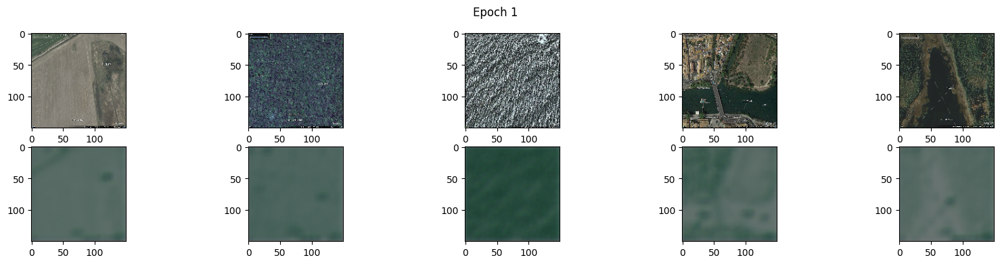

Epoch 1:  27%|██▋       | 10/37 [00:14<00:40,  1.49s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - loss: 0.6762 - val_loss: 0.6727



Epoch 2:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 2/17


Epoch 2:   3%|▎         | 1/37 [00:01<00:48,  1.35s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.6495

Epoch 2:   5%|▌         | 2/37 [00:02<00:46,  1.33s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.6478

Epoch 2:   8%|▊         | 3/37 [00:03<00:44,  1.32s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.6459 

Epoch 2:  11%|█         | 4/37 [00:05<00:43,  1.32s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.6444

Epoch 2:  14%|█▎        | 5/37 [00:06<00:41,  1.30s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.6424

Epoch 2:  16%|█▌        | 6/37 [00:07<00:40,  1.29s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.6406

Epoch 2:  19%|█▉        | 7/37 [00:09<00:38,  1.29s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.6390

Epoch 2:  22%|██▏       | 8/37 [00:10<00:37,  1.29s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.6375

Epoch 2:  24%|██▍       | 9/37 [00:11<00:36,  1.29s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.6359

Epoch 2:  27%|██▋       | 10/37 [00:12<00:26,  1.01batch/s]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss:


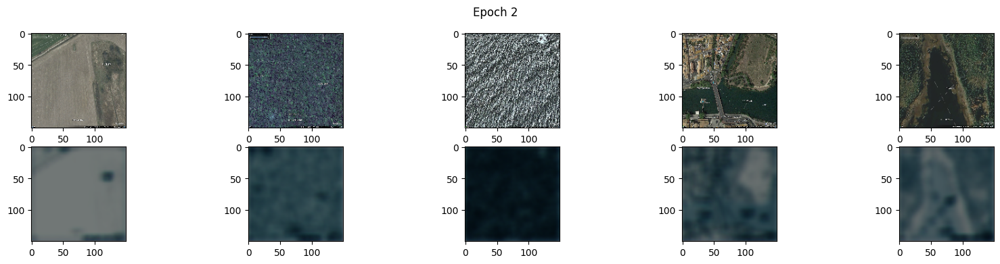

Epoch 2:  27%|██▋       | 10/37 [00:13<00:36,  1.34s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 0.6335 - val_loss: 0.6293



Epoch 3:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 3/17


Epoch 3:   3%|▎         | 1/37 [00:01<00:50,  1.39s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.5946

Epoch 3:   5%|▌         | 2/37 [00:02<00:46,  1.34s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.5913

Epoch 3:   8%|▊         | 3/37 [00:03<00:44,  1.32s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5894 

Epoch 3:  11%|█         | 4/37 [00:05<00:42,  1.30s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.5877

Epoch 3:  14%|█▎        | 5/37 [00:06<00:41,  1.30s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5867

Epoch 3:  16%|█▌        | 6/37 [00:07<00:40,  1.31s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5860

Epoch 3:  19%|█▉        | 7/37 [00:09<00:39,  1.30s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.5855

Epoch 3:  22%|██▏       | 8/37 [00:10<00:37,  1.30s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5850

Epoch 3:  24%|██▍       | 9/37 [00:11<00:36,  1.29s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5847

Epoch 3:  27%|██▋       | 10/37 [00:12<00:26,  1.02batch/s]

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss:


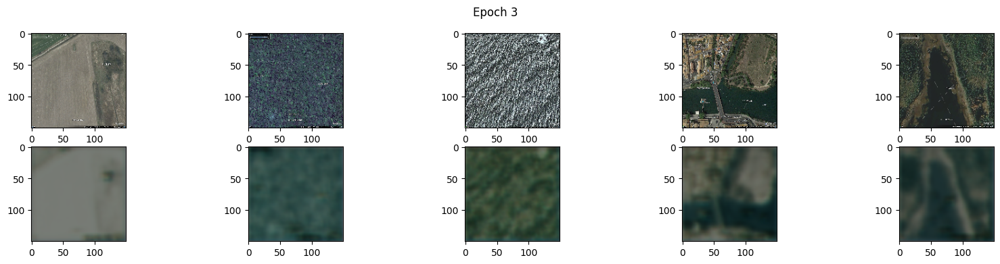

Epoch 3:  27%|██▋       | 10/37 [00:13<00:36,  1.35s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 0.5840 - val_loss: 0.6019



Epoch 4:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 4/17


Epoch 4:   3%|▎         | 1/37 [00:01<00:50,  1.41s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.5879

Epoch 4:   5%|▌         | 2/37 [00:02<00:48,  1.39s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5858

Epoch 4:   8%|▊         | 3/37 [00:04<00:46,  1.36s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5836 

Epoch 4:  11%|█         | 4/37 [00:05<00:44,  1.36s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5816

Epoch 4:  14%|█▎        | 5/37 [00:06<00:42,  1.33s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5793

Epoch 4:  16%|█▌        | 6/37 [00:08<00:40,  1.32s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5773

Epoch 4:  19%|█▉        | 7/37 [00:09<00:39,  1.30s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.5757

Epoch 4:  22%|██▏       | 8/37 [00:10<00:37,  1.29s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5747

Epoch 4:  24%|██▍       | 9/37 [00:11<00:35,  1.28s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5737

Epoch 4:  27%|██▋       | 10/37 [00:12<00:26,  1.01batch/s]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss:


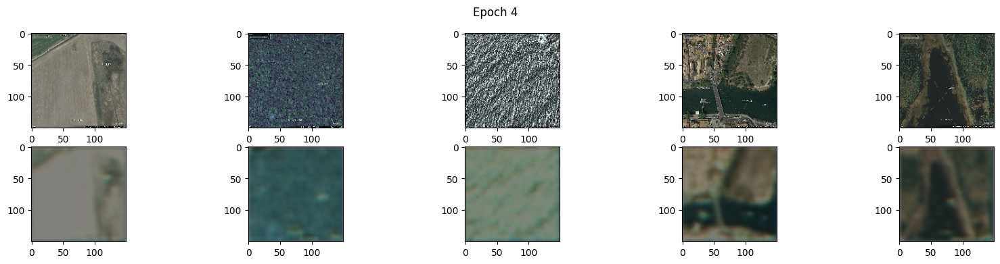

Epoch 4:  27%|██▋       | 10/37 [00:13<00:36,  1.36s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5721 - val_loss: 0.5888



Epoch 5:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 5/17


Epoch 5:   3%|▎         | 1/37 [00:01<00:51,  1.42s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.5648

Epoch 5:   5%|▌         | 2/37 [00:02<00:49,  1.41s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5656

Epoch 5:   8%|▊         | 3/37 [00:04<00:46,  1.37s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5650 

Epoch 5:  11%|█         | 4/37 [00:05<00:46,  1.41s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5649

Epoch 5:  14%|█▎        | 5/37 [00:06<00:43,  1.36s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5644

Epoch 5:  16%|█▌        | 6/37 [00:08<00:41,  1.34s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5642

Epoch 5:  19%|█▉        | 7/37 [00:09<00:40,  1.35s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5638

Epoch 5:  22%|██▏       | 8/37 [00:10<00:38,  1.33s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5632

Epoch 5:  24%|██▍       | 9/37 [00:12<00:37,  1.34s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5628

Epoch 5:  27%|██▋       | 10/37 [00:12<00:27,  1.02s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss:


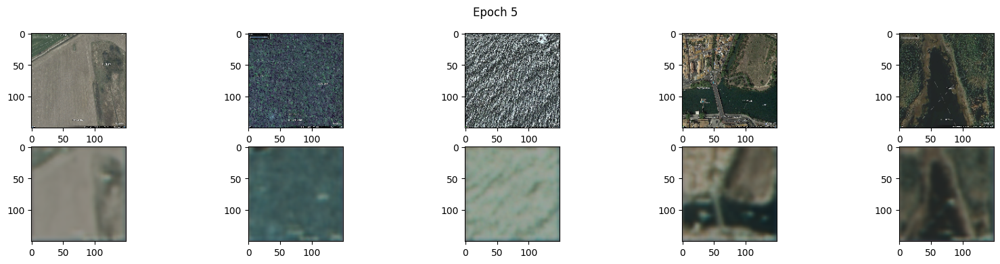

Epoch 5:  27%|██▋       | 10/37 [00:14<00:37,  1.40s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5622 - val_loss: 0.5845



Epoch 6:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 6/17


Epoch 6:   3%|▎         | 1/37 [00:12<07:25, 12.36s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 1:51 12s/step - loss: 0.5597

Epoch 6:   5%|▌         | 2/37 [00:18<05:01,  8.61s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 47s 6s/step - loss: 0.5585  

Epoch 6:   8%|▊         | 3/37 [00:25<04:24,  7.79s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 44s 6s/step - loss: 0.5587

Epoch 6:  11%|█         | 4/37 [00:31<03:54,  7.12s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 37s 6s/step - loss: 0.5592

Epoch 6:  14%|█▎        | 5/37 [00:37<03:32,  6.63s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 30s 6s/step - loss: 0.5589

Epoch 6:  16%|█▌        | 6/37 [00:42<03:18,  6.39s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 24s 6s/step - loss: 0.5583

Epoch 6:  19%|█▉        | 7/37 [00:48<03:07,  6.25s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.5580

Epoch 6:  22%|██▏       | 8/37 [00:54<02:53,  5.99s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 11s 6s/step - loss: 0.5578

Epoch 6:  24%|██▍       | 9/37 [00:55<02:06,  4.53s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.5575 

Epoch 6:  27%|██▋       | 10/37 [00:55<01:27,  3.23s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss:


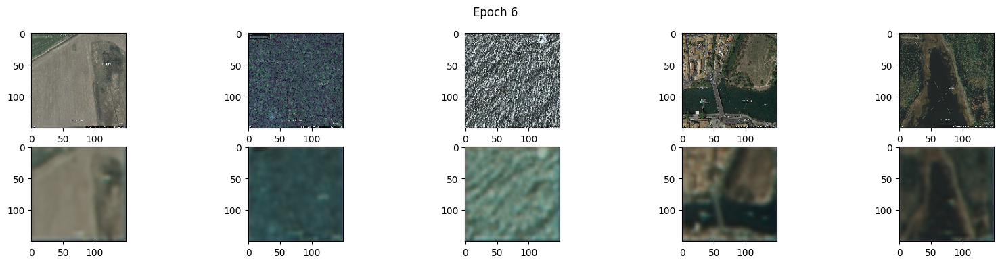

Epoch 6:  27%|██▋       | 10/37 [00:57<02:34,  5.74s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 57s 5s/step - loss: 0.5572 - val_loss: 0.5735



Epoch 7:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 7/17


Epoch 7:   3%|▎         | 1/37 [00:01<00:51,  1.44s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.5505

Epoch 7:   5%|▌         | 2/37 [00:02<00:49,  1.41s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5504

Epoch 7:   8%|▊         | 3/37 [00:04<00:46,  1.38s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5512 

Epoch 7:  11%|█         | 4/37 [00:05<00:44,  1.36s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5523

Epoch 7:  14%|█▎        | 5/37 [00:06<00:44,  1.38s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5528

Epoch 7:  16%|█▌        | 6/37 [00:08<00:42,  1.38s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5530

Epoch 7:  19%|█▉        | 7/37 [00:09<00:41,  1.39s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5533

Epoch 7:  22%|██▏       | 8/37 [00:11<00:39,  1.38s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5536

Epoch 7:  24%|██▍       | 9/37 [00:12<00:38,  1.36s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5534

Epoch 7:  27%|██▋       | 10/37 [00:12<00:27,  1.03s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss:


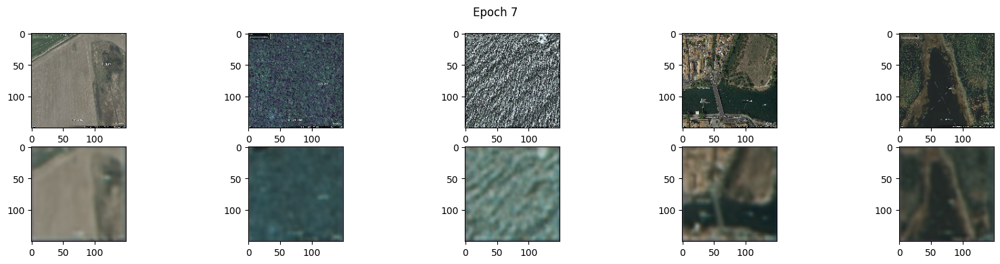

Epoch 7:  27%|██▋       | 10/37 [00:14<00:38,  1.43s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5532 - val_loss: 0.5692



Epoch 8:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 8/17


Epoch 8:   3%|▎         | 1/37 [00:01<00:48,  1.36s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.5603

Epoch 8:   5%|▌         | 2/37 [00:02<00:46,  1.32s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.5574

Epoch 8:   8%|▊         | 3/37 [00:03<00:45,  1.33s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5551 

Epoch 8:  11%|█         | 4/37 [00:05<00:43,  1.32s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.5539

Epoch 8:  14%|█▎        | 5/37 [00:06<00:41,  1.31s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5533

Epoch 8:  16%|█▌        | 6/37 [00:07<00:40,  1.31s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5532

Epoch 8:  19%|█▉        | 7/37 [00:09<00:39,  1.30s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.5534

Epoch 8:  22%|██▏       | 8/37 [00:10<00:38,  1.31s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5534

Epoch 8:  24%|██▍       | 9/37 [00:11<00:36,  1.30s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5533

Epoch 8:  27%|██▋       | 10/37 [00:12<00:26,  1.01batch/s]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss:


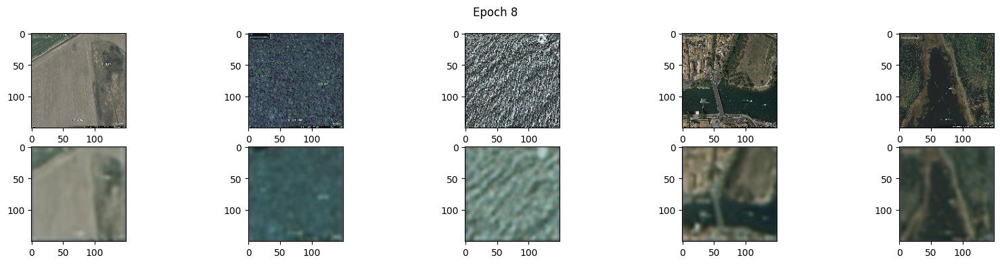

Epoch 8:  27%|██▋       | 10/37 [00:13<00:36,  1.35s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 0.5532 - val_loss: 0.5713



Epoch 9:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 9/17


Epoch 9:   3%|▎         | 1/37 [00:01<00:46,  1.29s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5497

Epoch 9:   5%|▌         | 2/37 [00:02<00:45,  1.29s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.5504

Epoch 9:   8%|▊         | 3/37 [00:03<00:43,  1.28s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5503 

Epoch 9:  11%|█         | 4/37 [00:05<00:42,  1.28s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.5496

Epoch 9:  14%|█▎        | 5/37 [00:06<00:40,  1.28s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5498

Epoch 9:  16%|█▌        | 6/37 [00:07<00:39,  1.27s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5501

Epoch 9:  19%|█▉        | 7/37 [00:08<00:38,  1.27s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.5504

Epoch 9:  22%|██▏       | 8/37 [00:10<00:36,  1.27s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5507

Epoch 9:  24%|██▍       | 9/37 [00:11<00:35,  1.28s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5510

Epoch 9:  27%|██▋       | 10/37 [00:11<00:26,  1.02batch/s]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss:


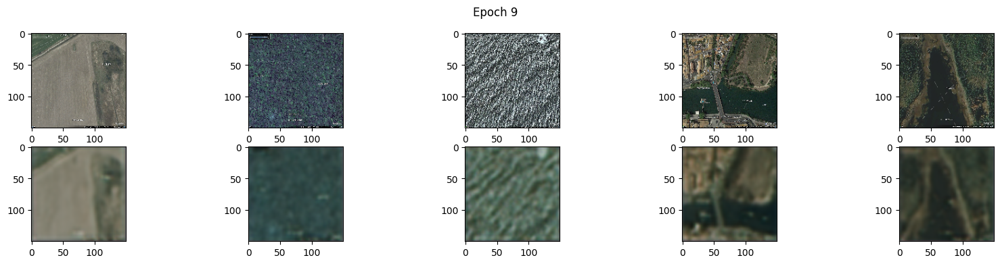

Epoch 9:  27%|██▋       | 10/37 [00:13<00:35,  1.32s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 0.5513 - val_loss: 0.5697



Epoch 10:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 10/17


Epoch 10:   3%|▎         | 1/37 [00:01<00:47,  1.31s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5575

Epoch 10:   5%|▌         | 2/37 [00:02<00:48,  1.38s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5543

Epoch 10:   8%|▊         | 3/37 [00:04<00:47,  1.41s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.5512

Epoch 10:  11%|█         | 4/37 [00:05<00:46,  1.41s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5500 

Epoch 10:  14%|█▎        | 5/37 [00:06<00:44,  1.38s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.5496

Epoch 10:  16%|█▌        | 6/37 [00:08<00:42,  1.36s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5494

Epoch 10:  19%|█▉        | 7/37 [00:09<00:40,  1.35s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5494

Epoch 10:  22%|██▏       | 8/37 [00:10<00:38,  1.34s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5495

Epoch 10:  24%|██▍       | 9/37 [00:12<00:37,  1.33s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5495

Epoch 10:  27%|██▋       | 10/37 [00:12<00:27,  1.02s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss:


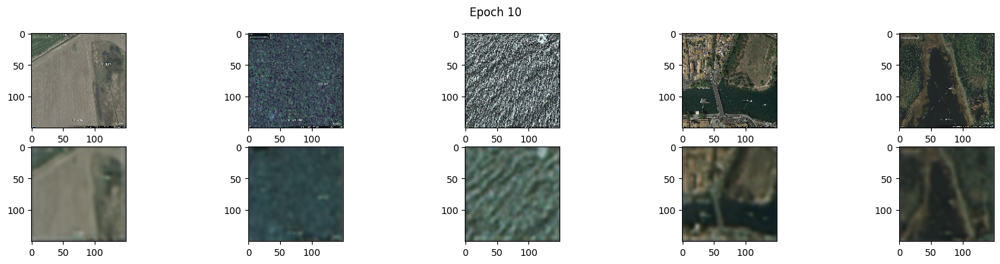

Epoch 10:  27%|██▋       | 10/37 [00:13<00:37,  1.40s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5496 - val_loss: 0.5697



Epoch 11:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 11/17


Epoch 11:   3%|▎         | 1/37 [00:01<00:49,  1.37s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.5591

Epoch 11:   5%|▌         | 2/37 [00:02<00:49,  1.42s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5558

Epoch 11:   8%|▊         | 3/37 [00:04<00:47,  1.40s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5522 

Epoch 11:  11%|█         | 4/37 [00:05<00:45,  1.37s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5509

Epoch 11:  14%|█▎        | 5/37 [00:06<00:43,  1.35s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5500

Epoch 11:  16%|█▌        | 6/37 [00:08<00:41,  1.34s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5495

Epoch 11:  19%|█▉        | 7/37 [00:09<00:40,  1.34s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5493

Epoch 11:  22%|██▏       | 8/37 [00:10<00:39,  1.37s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5493

Epoch 11:  24%|██▍       | 9/37 [00:12<00:39,  1.40s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5493

Epoch 11:  27%|██▋       | 10/37 [00:12<00:28,  1.07s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss:


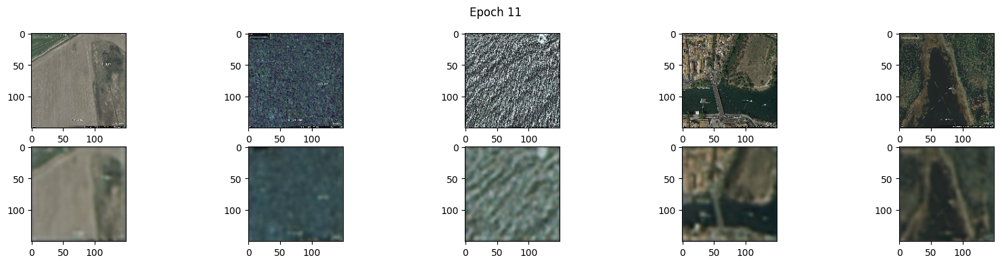

Epoch 11:  27%|██▋       | 10/37 [00:14<00:38,  1.42s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5493 - val_loss: 0.5666



Epoch 12:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 12/17


Epoch 12:   3%|▎         | 1/37 [00:01<00:52,  1.47s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 0.5630

Epoch 12:   5%|▌         | 2/37 [00:03<00:53,  1.54s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - loss: 0.5622

Epoch 12:   8%|▊         | 3/37 [00:04<00:51,  1.51s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - loss: 0.5609

Epoch 12:  11%|█         | 4/37 [00:06<00:49,  1.51s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - loss: 0.5601 

Epoch 12:  14%|█▎        | 5/37 [00:07<00:47,  1.48s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - loss: 0.5587

Epoch 12:  16%|█▌        | 6/37 [00:08<00:45,  1.47s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5576

Epoch 12:  19%|█▉        | 7/37 [00:10<00:43,  1.45s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5566

Epoch 12:  22%|██▏       | 8/37 [00:11<00:42,  1.46s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5555

Epoch 12:  24%|██▍       | 9/37 [00:13<00:39,  1.42s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5547

Epoch 12:  27%|██▋       | 10/37 [00:13<00:29,  1.08s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss:


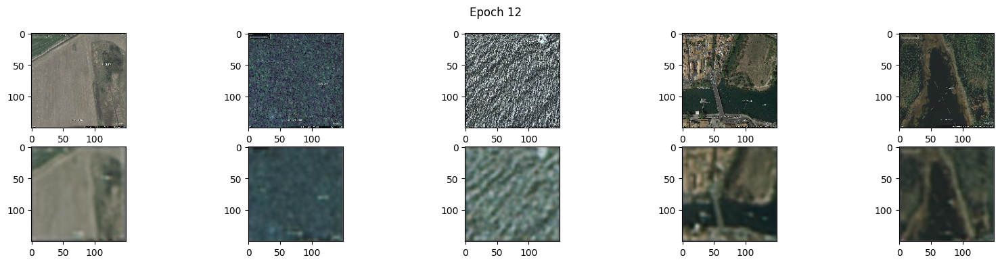

Epoch 12:  27%|██▋       | 10/37 [00:15<00:40,  1.51s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - loss: 0.5536 - val_loss: 0.5658



Epoch 13:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 13/17


Epoch 13:   3%|▎         | 1/37 [00:01<00:52,  1.47s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 0.5527

Epoch 13:   5%|▌         | 2/37 [00:02<00:50,  1.44s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5537

Epoch 13:   8%|▊         | 3/37 [00:04<00:48,  1.41s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5526 

Epoch 13:  11%|█         | 4/37 [00:05<00:45,  1.39s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5518

Epoch 13:  14%|█▎        | 5/37 [00:06<00:43,  1.37s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5518

Epoch 13:  16%|█▌        | 6/37 [00:08<00:42,  1.36s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5518

Epoch 13:  19%|█▉        | 7/37 [00:09<00:41,  1.38s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5517

Epoch 13:  22%|██▏       | 8/37 [00:11<00:40,  1.38s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5514

Epoch 13:  24%|██▍       | 9/37 [00:12<00:38,  1.37s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5510

Epoch 13:  27%|██▋       | 10/37 [00:12<00:28,  1.05s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss:


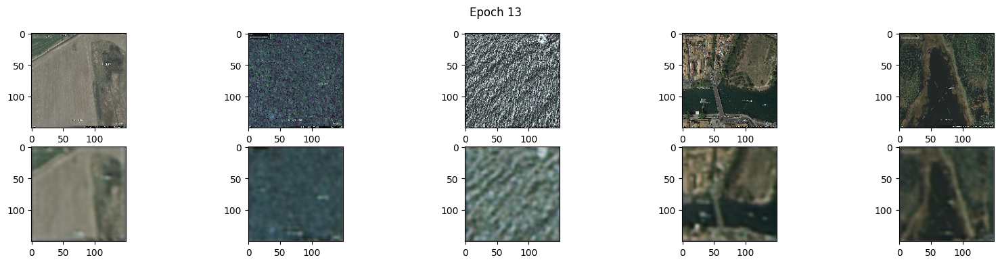

Epoch 13:  27%|██▋       | 10/37 [00:14<00:38,  1.42s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5504 - val_loss: 0.5652



Epoch 14:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 14/17


Epoch 14:   3%|▎         | 1/37 [00:01<00:53,  1.50s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - loss: 0.5422

Epoch 14:   5%|▌         | 2/37 [00:02<00:50,  1.46s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5446

Epoch 14:   8%|▊         | 3/37 [00:04<00:47,  1.40s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5455 

Epoch 14:  11%|█         | 4/37 [00:05<00:45,  1.39s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5465

Epoch 14:  14%|█▎        | 5/37 [00:06<00:43,  1.37s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5469

Epoch 14:  16%|█▌        | 6/37 [00:08<00:41,  1.35s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5470

Epoch 14:  19%|█▉        | 7/37 [00:09<00:40,  1.36s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5469

Epoch 14:  22%|██▏       | 8/37 [00:11<00:39,  1.35s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5468

Epoch 14:  24%|██▍       | 9/37 [00:12<00:38,  1.38s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5468

Epoch 14:  27%|██▋       | 10/37 [00:12<00:28,  1.05s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss:


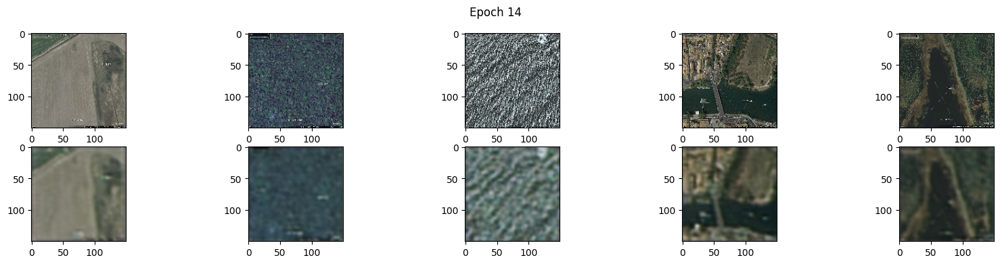

Epoch 14:  27%|██▋       | 10/37 [00:14<00:38,  1.43s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5469 - val_loss: 0.5650



Epoch 15:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 15/17


Epoch 15:   3%|▎         | 1/37 [00:01<00:52,  1.46s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 0.5474

Epoch 15:   5%|▌         | 2/37 [00:02<00:50,  1.44s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5467

Epoch 15:   8%|▊         | 3/37 [00:04<00:47,  1.40s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5455 

Epoch 15:  11%|█         | 4/37 [00:05<00:46,  1.40s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5449

Epoch 15:  14%|█▎        | 5/37 [00:07<00:45,  1.41s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5445

Epoch 15:  16%|█▌        | 6/37 [00:08<00:42,  1.38s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5443

Epoch 15:  19%|█▉        | 7/37 [00:09<00:40,  1.37s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5443

Epoch 15:  22%|██▏       | 8/37 [00:11<00:39,  1.35s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5445

Epoch 15:  24%|██▍       | 9/37 [00:12<00:37,  1.34s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5447

Epoch 15:  27%|██▋       | 10/37 [00:12<00:27,  1.03s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss:


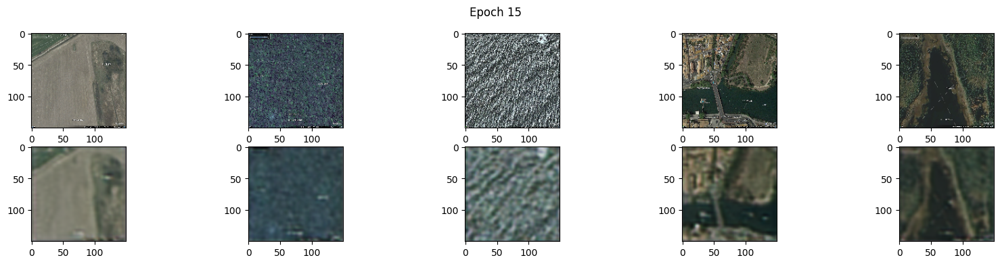

Epoch 15:  27%|██▋       | 10/37 [00:14<00:38,  1.42s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5451 - val_loss: 0.5647



Epoch 16:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 16/17


Epoch 16:   3%|▎         | 1/37 [00:01<00:53,  1.47s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 0.5460

Epoch 16:   5%|▌         | 2/37 [00:02<00:51,  1.47s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.5467

Epoch 16:   8%|▊         | 3/37 [00:04<00:48,  1.42s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5466 

Epoch 16:  11%|█         | 4/37 [00:05<00:45,  1.38s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.5463

Epoch 16:  14%|█▎        | 5/37 [00:06<00:43,  1.35s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5466

Epoch 16:  16%|█▌        | 6/37 [00:08<00:41,  1.35s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5468

Epoch 16:  19%|█▉        | 7/37 [00:09<00:40,  1.35s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.5467

Epoch 16:  22%|██▏       | 8/37 [00:10<00:38,  1.34s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5466

Epoch 16:  24%|██▍       | 9/37 [00:12<00:37,  1.35s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5466

Epoch 16:  27%|██▋       | 10/37 [00:12<00:27,  1.03s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss:


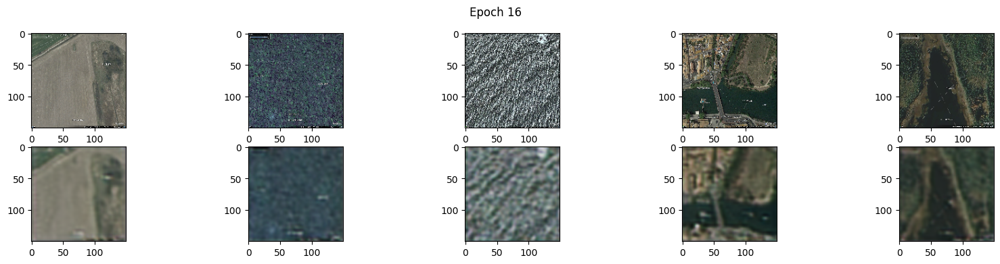

Epoch 16:  27%|██▋       | 10/37 [00:14<00:37,  1.40s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5467 - val_loss: 0.5639



Epoch 17:   0%|          | 0/37 [00:00<?, ?batch/s]

Epoch 17/17


Epoch 17:   3%|▎         | 1/37 [00:01<00:49,  1.37s/batch]

 1/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.5508

Epoch 17:   5%|▌         | 2/37 [00:02<00:46,  1.32s/batch]

 2/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.5475

Epoch 17:   8%|▊         | 3/37 [00:03<00:44,  1.31s/batch]

 3/10 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.5471 

Epoch 17:  11%|█         | 4/37 [00:05<00:43,  1.31s/batch]

 4/10 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.5475

Epoch 17:  14%|█▎        | 5/37 [00:06<00:41,  1.31s/batch]

 5/10 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.5479

Epoch 17:  16%|█▌        | 6/37 [00:07<00:40,  1.32s/batch]

 6/10 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.5479

Epoch 17:  19%|█▉        | 7/37 [00:09<00:39,  1.32s/batch]

 7/10 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.5477

Epoch 17:  22%|██▏       | 8/37 [00:10<00:38,  1.32s/batch]

 8/10 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - loss: 0.5476

Epoch 17:  24%|██▍       | 9/37 [00:11<00:36,  1.32s/batch]

 9/10 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.5475

Epoch 17:  27%|██▋       | 10/37 [00:12<00:27,  1.00s/batch]

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss:


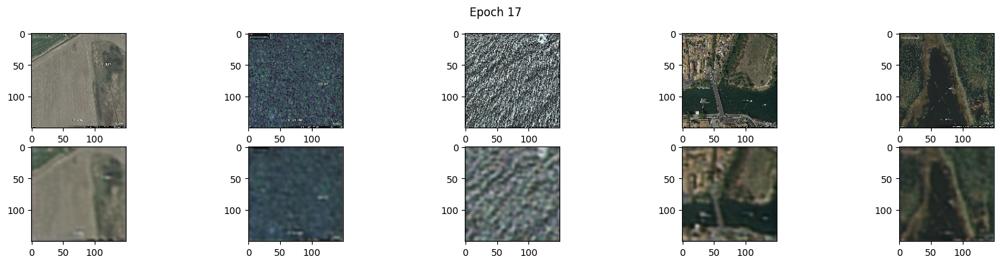

Epoch 17:  27%|██▋       | 10/37 [00:13<00:37,  1.37s/batch]

10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 0.5473 - val_loss: 0.5641


In [23]:
# Train the autoencoder with custom callbacks
callbacks = [
    ImageDisplayCallback(X_test),
    TQDMProgressBarCallback()
]

#autoencoder.fit(X_train, X_train, epochs=50, batch_size=128, shuffle=True, validation_data=(X_test, X_test), callbacks=callbacks)
autoencoder.fit(X_train, X_train, epochs=17, batch_size=128, shuffle=True, validation_data=(X_test, X_test), callbacks=callbacks)

## Using the Trained Autoencoder for Classification
Use the trained autoencoder to classify pixels in the images.

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


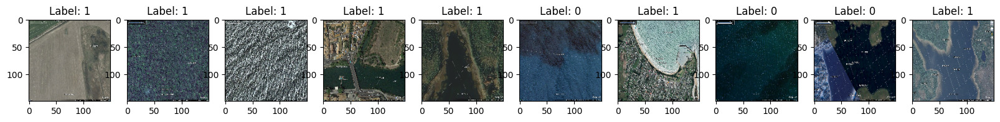

In [28]:
# Encode images
encoder = Model(inputs=autoencoder.input, outputs=autoencoder.layers[6].output)
encoded_train_images = encoder.predict(X_train)
encoded_test_images = encoder.predict(X_test)

# Flatten encoded representations for clustering
encoded_train_features = encoded_train_images.reshape(encoded_train_images.shape[0], -1)
encoded_test_features = encoded_test_images.reshape(encoded_test_images.shape[0], -1)

# Apply K-Means clustering
n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
train_labels = kmeans.fit_predict(encoded_train_features)
test_labels = kmeans.predict(encoded_test_features)

# Assign labels to images
train_labeled_images = [(img, label) for img, label in zip(X_train, train_labels)]
test_labeled_images = [(img, label) for img, label in zip(X_test, test_labels)]

# Save labeled datasets
with open('train_labeled_images.pkl', 'wb') as f:
    pickle.dump(train_labeled_images, f)

with open('test_labeled_images.pkl', 'wb') as f:
    pickle.dump(test_labeled_images, f)

# Visualize labeled images
def visualize_labeled_images(images, labels, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(images[i])
        plt.title(f"Label: {labels[i]}")
    plt.show()

visualize_labeled_images(X_test, test_labels)

## Conclusion
This notebook demonstrates how to use K-Means clustering and an autoencoder for automatic classification of pixels between water and mainland. This approach can be extended and refined with more complex models and larger datasets for improved accuracy.